# 본론1

### 1. 대한민국의 지진 현황

In [59]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
plt.rc('font', family='Malgun Gothic')
plt.rcParams['axes.unicode_minus'] =False

In [60]:
df_kor = pd.read_csv('..\찐최종 데이터셋\지진\시계열_한국_지진데이터_찐최종.csv')
df_kor

,발생시각,규모,깊이,진도,위도,경도,위치
0,2000-01-18 15:08:50,3.0,NaN,NaN,38.70 N,127.90 E,북한 강원 회양 동쪽 26km 지역
1,2000-02-21 01:06:31,2.1,NaN,NaN,35.80 N,128.20 E,경북 고령군 북서쪽 10km 지역
2,2000-03-15 01:10:52,2.5,NaN,NaN,36.30 N,125.90 E,전북 군산시 어청도 북북서쪽 20km 해역
3,2000-03-21 13:43:56,2.3,NaN,NaN,36.50 N,126.00 E,충남 태안군 남서쪽 38km 해역
4,2000-04-12 04:44:01,3.5,NaN,NaN,36.90 N,125.30 E,충남 태안군 서격렬비열도 북북서쪽 39km 해역
...,...,...,...,...,...,...,...
11769,2024-11-04 05:47:05,1.5,18.0,1.0,36.47 N,129.63 E,경북 영덕군 동북동쪽 24km 해역
11770,2024-11-04 06:15:43,1.8,18.0,1.0,36.47 N,129.63 E,경북 영덕군 동북동쪽 24km 해역
11771,2024-11-04 07:34:00,1.3,18.0,1.0,38.63 N,127.52 E,북한 강원 회양 남서쪽 11km 지역
11772,2024-11-04 09:22:39,1.3,13.0,1.0,35.75 N,129.18 E,경북 경주시 남남서쪽 12km 지역


In [61]:
df_kor.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11774 entries, 0 to 11773
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   발생시각    11774 non-null  object 
 1   규모      11774 non-null  float64
 2   깊이      10494 non-null  float64
 3   진도      5226 non-null   float64
 4   위도      11774 non-null  object 
 5   경도      11774 non-null  object 
 6   위치      11774 non-null  object 
dtypes: float64(3), object(4)
memory usage: 644.0+ KB


결측치 처리
- 발생시각, 규모, 위도, 경도, 위치 컬럼은 결측치가 존재하지 않음
- 깊이 컬럼에 11774개의 데이터행 중 1280개의 결측치 존재, 약 9%가 결측치
- 진도 컬럼에 11774개의 데이터행 중 6548개의 결측치 존재, 약 50%가 결측치
- 깊이 컬럼은 분석에 주요한 컬럼은 아님. 깊이 컬럼 사용시 결측치가 있으면 제거하고 분석 진행
- 진도 컬럼은 결측치가 너무 많아 사용하기 힘듦, 2018-07-18부터 존재

In [62]:
df_kor.describe(include='all')

,발생시각,규모,깊이,진도,위도,경도,위치
count,11774,11774.000000,10494.000000,5226.000000,11774,11774,11774
unique,11774,NaN,NaN,NaN,686,604,4766
top,2000-01-18 15:08:50,NaN,NaN,NaN,35.76 N,129.19 E,경북 경주시 남남서쪽 11km 지역
freq,1,NaN,NaN,NaN,1189,1409,878
mean,NaN,1.417437,12.840957,1.133754,NaN,NaN,NaN
std,NaN,0.619835,4.297628,0.408406,NaN,NaN,NaN
min,NaN,0.000000,5.000000,1.000000,NaN,NaN,NaN
25%,NaN,1.000000,10.000000,1.000000,NaN,NaN,NaN
50%,NaN,1.300000,13.000000,1.000000,NaN,NaN,NaN
75%,NaN,1.700000,15.000000,1.000000,NaN,NaN,NaN


일반적 통계
- 2000년부터 2024년까지 11774회의 지진 발생
- 평균 규모는 1.4
- 규모의 최소값이 0이 존재 -> 규모가 0에 가까운 관측치로 판단 -> 미세한 지진이라도 발생위치 등 필요하기 때문에 0.01로 값 대치
- 최고 규모는 5.8
- 지진이 발생한 11774곳의 위치중 4766곳의 다른 장소에서 발생

In [63]:
# 규모 값이 0.0을 0.01로 대치
print(df_kor[df_kor['규모']==0.0])
df_kor['규모'].replace(0.0, 0.01, inplace=True)
print()
print(df_kor[df_kor['규모']==0.0])

                     발생시각   규모    깊이  진도       위도        경도  \
791   2014-05-02 08:46:00  0.0   9.0 NaN  36.34 N  127.90 E   
897   2014-08-05 18:08:25  0.0   6.0 NaN  37.61 N  127.01 E   
1709  2016-08-20 12:49:57  0.0   NaN NaN  38.40 N  128.10 E   
3170  2016-09-16 01:20:32  0.0   7.0 NaN  35.81 N  129.19 E   
3762  2016-09-25 10:20:15  0.0  13.0 NaN  35.74 N  129.19 E   
3764  2016-09-25 12:09:01  0.0  12.0 NaN  35.75 N  129.19 E   

                        위치  
791    경북 상주시 서남서쪽 25km 지역  
897     서울 성북구 북북서쪽 2km 지역  
1709  북한 강원 회양 남동쪽 55km 지역  
3170    경북 경주시 남남서쪽 6km 지역  
3762   경북 경주시 남남서쪽 13km 지역  
3764   경북 경주시 남남서쪽 12km 지역  

Empty DataFrame
Columns: [발생시각, 규모, 깊이, 진도, 위도, 경도, 위치]
Index: []


C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_2144\3532075575.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_kor['규모'].replace(0.0, 0.01, inplace=True)


##### (1) 한국 지진 지도에 시각화
태블로 사용

##### (2) 한국 지진 규모에 대한 시각화

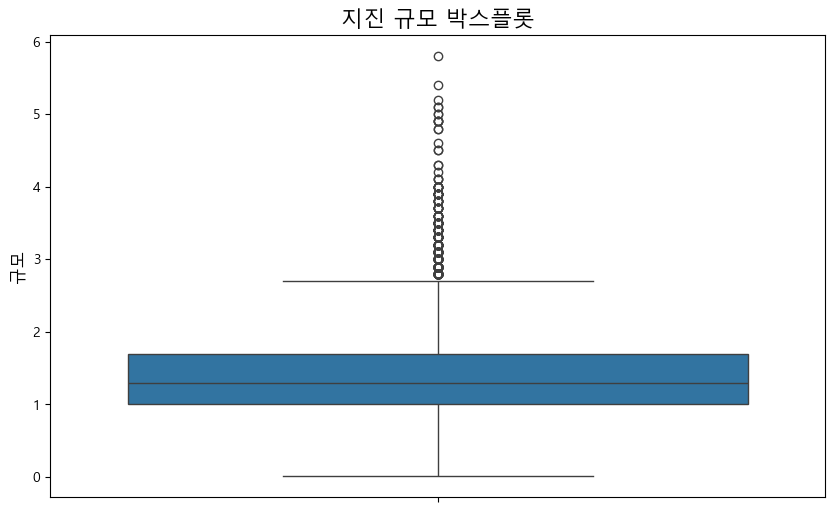

In [64]:
# 박스플롯 그리기
plt.figure(figsize=(10, 6))
sns.boxplot(y='규모', data=df_kor)
plt.title('지진 규모 박스플롯', fontsize=16)
plt.ylabel('규모', fontsize=12)
plt.show()

박스 플롯으로 확인하니 평균적으로 규모 1~2 사이에 몰려있고 이상치는 규모가 3이상인 지진들이 존재

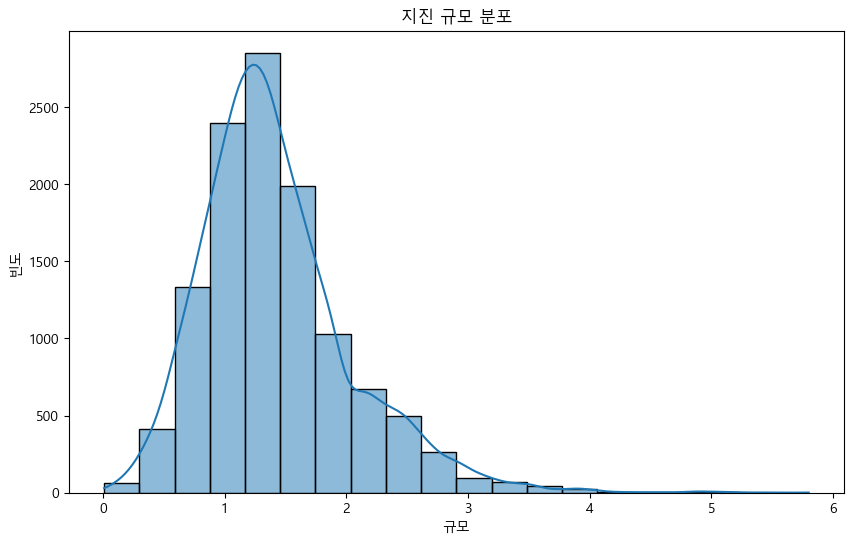

In [65]:
# 규모 분포 히스토그램
plt.figure(figsize=(10, 6))
sns.histplot(df_kor['규모'], bins=20, kde=True)
plt.title('지진 규모 분포')
plt.xlabel('규모')
plt.ylabel('빈도')
plt.show()
plt.show()

히스토그램 2000년부터 지금까지의 지진 규모의 분포는 1~2 사이의 분포에 몰려있다

##### (3) 한국 지진 규모 3이상 데이터 

In [66]:
import folium
from folium.plugins import MarkerCluster
from IPython.display import display

# 위도와 경도 데이터 전처리 함수
def parse_coordinates(coord_str):
    parts = coord_str.split()
    if len(parts) == 2:
        value, direction = parts
        value = float(value)
        if direction in ['S', 'W']:
            value = -value
        return value
    return None

# 규모가 3 이상인 지진 데이터 필터링
r = df_kor[df_kor['규모'] >= 3.0]

# 위도와 경도 데이터 전처리
r['위도_숫자'] = r['위도'].apply(parse_coordinates)
r['경도_숫자'] = r['경도'].apply(parse_coordinates)

# 이상치 계산
Q1 = r['규모'].quantile(0.25)
Q3 = r['규모'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers = r[(r['규모'] < lower_bound) | (r['규모'] > upper_bound)]

print("\n이상치 데이터:")
if not outliers.empty:
    for index, row in outliers.iterrows():
        print(f"발생시각: {row['발생시각']}, 규모: {row['규모']:.2f}, 위치: {row['위치']}")
else:
    print("이상치가 없습니다.")

print(f"\n이상치 개수: {len(outliers)}")

# 이상치를 제외한 데이터의 통계 정보
normal_data = r[(r['규모'] >= lower_bound) & (r['규모'] <= upper_bound)]
print("\n이상치를 제외한 데이터 통계:")
print(f"데이터 개수: {len(normal_data)}")
print(f"규모 평균: {normal_data['규모'].mean():.2f}")
print(f"규모 중앙값: {normal_data['규모'].median():.2f}")
print(f"규모 최대값: {normal_data['규모'].max():.2f}")




이상치 데이터:
발생시각: 2003-03-23 05:38:41, 규모: 4.90, 위치: 전남 신안군 흑산면 서북서쪽 88km 해역
발생시각: 2003-03-30 20:10:53, 규모: 5.00, 위치: 인천 백령도 서남서쪽 88km 해역
발생시각: 2004-05-29 19:14:24, 규모: 5.20, 위치: 경북 울진군 동남동쪽 74km 해역
발생시각: 2007-01-20 20:56:53, 규모: 4.80, 위치: 강원 평창군 북북동쪽 39km 지역
발생시각: 2008-05-31 21:59:30, 규모: 4.20, 위치: 제주 제주시 서쪽 78km 해역
발생시각: 2013-04-21 08:21:27, 규모: 4.90, 위치: 전남 신안군 흑산면 북서쪽 101km 해역
발생시각: 2013-05-18 07:02:24, 규모: 4.90, 위치: 인천 백령도 남쪽 31km 해역
발생시각: 2014-04-01 04:48:35, 규모: 5.10, 위치: 충남 태안군 서격렬비도 서북서쪽 100km 해역
발생시각: 2016-07-05 20:33:03, 규모: 5.00, 위치: 울산 동구 동쪽 52km 해역
발생시각: 2016-09-12 19:44:32, 규모: 5.10, 위치: 경북 경주시 남남서쪽 8.2km 지역
발생시각: 2016-09-12 20:32:54, 규모: 5.80, 위치: 경북 경주시 남남서쪽 8.7km 지역
발생시각: 2016-09-19 20:33:58, 규모: 4.50, 위치: 경북 경주시 남남서쪽 11km 지역
발생시각: 2017-11-15 14:29:31, 규모: 5.40, 위치: 경북 포항시 북구 북쪽 8km 지역
발생시각: 2017-11-15 16:49:30, 규모: 4.30, 위치: 경북 포항시 북구 북쪽 9km 지역
발생시각: 2018-02-11 05:03:03, 규모: 4.60, 위치: 경북 포항시 북구 북서쪽 5km 지역
발생시각: 2019-04-19 11:16:43, 규모: 4.30, 위치: 강원 동해시 북동쪽 54km 해역
발생시각

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_2144\969368783.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  r['위도_숫자'] = r['위도'].apply(parse_coordinates)
C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_2144\969368783.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  r['경도_숫자'] = r['경도'].apply(parse_coordinates)


규모가 3이상인 데이터 모음에서 이상치는 19개

In [67]:
# 규모가 큰 상위 20개 지진 선택
top_20_earthquakes = r.sort_values('규모', ascending=False).head(20)

# 한국의 중심 좌표 (대략적인 위치)
korea_center = [36.5, 127.5]

# 지도 생성
m = folium.Map(location=korea_center, zoom_start=7)
marker_cluster = MarkerCluster().add_to(m)

# 각 지진에 대한 마커 추가
for idx, row in top_20_earthquakes.iterrows():
    if pd.notnull(row['위도_숫자']) and pd.notnull(row['경도_숫자']):
        folium.Marker(
            location=[row['위도_숫자'], row['경도_숫자']],
            popup=f"발생시각: {row['발생시각']}<br>규모: {row['규모']}<br>깊이: {row.get('깊이', '정보 없음')}km<br>위치: {row['위치']}",
            tooltip=f"규모 {row['규모']} 지진"
        ).add_to(marker_cluster)

# 지도 표시
display(m)

# 결과 출력
print("\n규모가 큰 상위 20개 지진:")
print(top_20_earthquakes[['발생시각', '규모', '깊이', '위치', '위도_숫자', '경도_숫자']])

# 발생시각을 datetime 형식으로 변환
top_20_earthquakes['발생시각'] = pd.to_datetime(top_20_earthquakes['발생시각'])

# 연도별 상위 20개 지진 분포
year_distribution = top_20_earthquakes['발생시각'].dt.year.value_counts().sort_index()
print("\n연도별 상위 20개 지진 분포:")
print(year_distribution)

# 지역별 상위 20개 지진 분포
location_distribution = top_20_earthquakes['위치'].value_counts()
print("\n지역별 상위 20개 지진 분포:")
print(location_distribution)



규모가 큰 상위 20개 지진:
                      발생시각   규모    깊이                          위치  위도_숫자  \
1811   2016-09-12 20:32:54  5.8  15.0        경북 경주시 남남서쪽 8.7km 지역  35.76   
5467   2017-11-15 14:29:31  5.4   7.0         경북 포항시 북구 북쪽 8km 지역  36.11   
178    2004-05-29 19:14:24  5.2   NaN         경북 울진군 동남동쪽 74km 해역  36.80   
1745   2016-09-12 19:44:32  5.1  15.0        경북 경주시 남남서쪽 8.2km 지역  35.77   
765    2014-04-01 04:48:35  5.1   8.0  충남 태안군 서격렬비도 서북서쪽 100km 해역  36.95   
135    2003-03-30 20:10:53  5.0   NaN         인천 백령도 서남서쪽 88km 해역  37.80   
1651   2016-07-05 20:33:03  5.0  19.0            울산 동구 동쪽 52km 해역  35.51   
605    2013-05-18 07:02:24  4.9  11.0           인천 백령도 남쪽 31km 해역  37.68   
134    2003-03-23 05:38:41  4.9   NaN     전남 신안군 흑산면 서북서쪽 88km 해역  35.00   
596    2013-04-21 08:21:27  4.9   5.0     전남 신안군 흑산면 북서쪽 101km 해역  35.16   
9444   2021-12-14 17:19:14  4.9  17.0        제주 서귀포시 서남서쪽 41km 해역  33.09   
290    2007-01-20 20:56:53  4.8   NaN         강원 평창군 북북동쪽 39km 지역  37.

규모 상위 20개의 지진을 지도에 시각화

##### (4) 한국 지진 주요 내륙도시 지진 발생 현황

In [68]:
df_kor_cities = df_kor[df_kor['위치'].str.contains('서울|대전|대구|광주|수원|용인|고양|성남|세종')]
df_kor_cities

,발생시각,규모,깊이,진도,위도,경도,위치
28,2000-12-22 08:19:39,2.7,NaN,NaN,36.30 N,127.40 E,대전 중구 남서쪽 4km 지역
86,2002-03-25 18:10:26,2.4,NaN,NaN,37.10 N,127.20 E,경기 용인시 처인구 남남서쪽 12km 지역
152,2003-09-24 03:26:56,2.3,NaN,NaN,35.80 N,128.50 E,대구 달성군 서남서쪽 6km 지역
155,2003-10-05 05:03:53,2.1,NaN,NaN,36.30 N,127.30 E,대전 유성구 남서쪽 8km 지역
185,2004-07-14 20:37:55,2.1,NaN,NaN,36.40 N,127.30 E,대전 유성구 북서쪽 7km 지역
...,...,...,...,...,...,...,...
11631,2024-09-06 08:22:45,1.1,11.0,1.0,35.06 N,126.80 E,광주 남구 남서쪽 12km 지역
11638,2024-09-07 17:47:09,1.2,13.0,1.0,36.26 N,128.60 E,대구 군위군 북동쪽 3km 지역
11664,2024-09-17 20:54:16,1.0,14.0,1.0,36.27 N,127.46 E,대전 동구 남쪽 5km 지역
11672,2024-09-20 13:09:28,1.4,12.0,1.0,36.42 N,127.52 E,대전 동구 북북동쪽 13km 지역


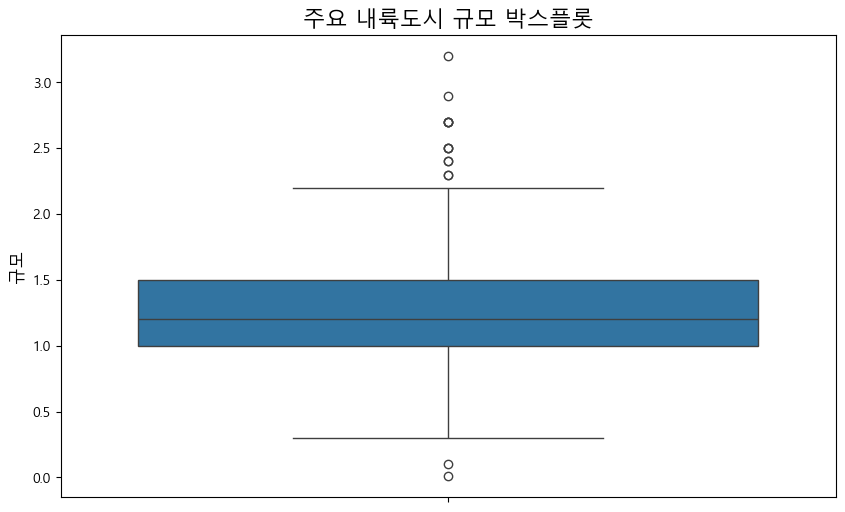

In [69]:
# 박스플롯 그리기
plt.figure(figsize=(10, 6))
sns.boxplot(y='규모', data=df_kor_cities)
plt.title('주요 내륙도시 규모 박스플롯', fontsize=16)
plt.ylabel('규모', fontsize=12)
plt.show()

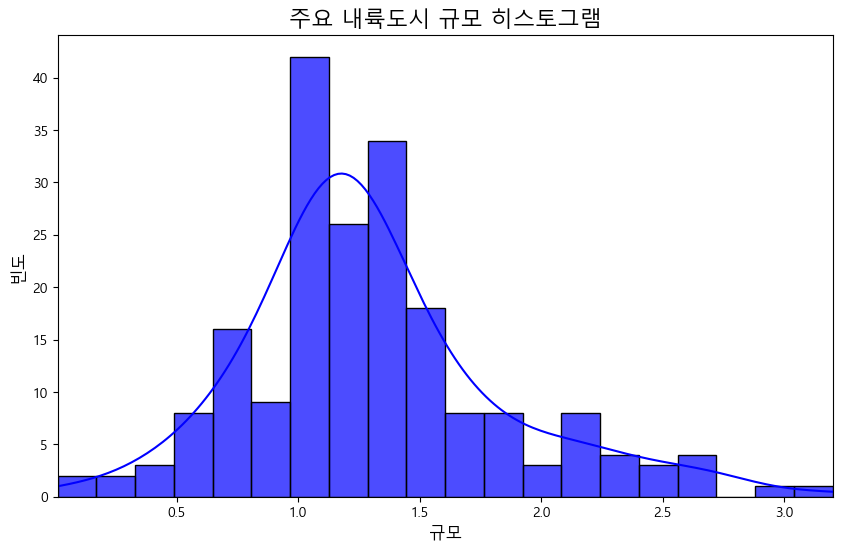

In [70]:
# 히스토그램 그리기
plt.figure(figsize=(10, 6))
sns.histplot(df_kor_cities['규모'], bins=20, kde=True, color='blue', alpha=0.7)
plt.title('주요 내륙도시 규모 히스토그램', fontsize=16)
plt.xlabel('규모', fontsize=12)
plt.ylabel('빈도', fontsize=12)
plt.xlim(df_kor_cities['규모'].min(), df_kor_cities['규모'].max())  # x축 범위 설정
plt.show()

박스플롯과 히스토그램에서 알 수있듯 대개 3이하의 지진만 발생. 다행히도 아직 주요 내륙 도시에서는 규모가 큰 지진이 발생하지 않았음

##### (5) 한국 지진 내륙지역 지진 발생 현황

In [71]:
df_kor_inside = df_kor[df_kor['위치'].str.contains('지역')]
df_kor_inside

,발생시각,규모,깊이,진도,위도,경도,위치
0,2000-01-18 15:08:50,3.0,NaN,NaN,38.70 N,127.90 E,북한 강원 회양 동쪽 26km 지역
1,2000-02-21 01:06:31,2.1,NaN,NaN,35.80 N,128.20 E,경북 고령군 북서쪽 10km 지역
5,2000-04-15 08:05:19,2.3,NaN,NaN,36.60 N,128.30 E,경북 예천군 서남서쪽 15km 지역
7,2000-05-09 06:55:36,2.3,NaN,NaN,35.20 N,128.10 E,경남 진주시 북동쪽 2km 지역
9,2000-05-11 15:01:08,2.9,NaN,NaN,38.60 N,127.80 E,북한 강원 회양 남동쪽 21km 지역
...,...,...,...,...,...,...,...
11765,2024-11-03 15:39:13,1.9,5.0,1.0,38.65 N,125.67 E,북한 황해북도 송림 남남동쪽 10km 지역
11767,2024-11-04 01:44:11,1.0,9.0,1.0,34.98 N,127.38 E,전남 순천시 서북서쪽 10km 지역
11768,2024-11-04 03:24:06,1.5,13.0,1.0,35.76 N,129.17 E,경북 경주시 남남서쪽 12km 지역
11771,2024-11-04 07:34:00,1.3,18.0,1.0,38.63 N,127.52 E,북한 강원 회양 남서쪽 11km 지역


In [72]:
# df_kor_inside에서 내륙 주요도시는 빼고 데이터프레임 생성
df_kor_inside_filtered = df_kor_inside[~df_kor_inside['위치'].str.contains('서울|대전|대구|광주|수원|용인|고양|성남|세종', na=False)]
df_kor_inside_filtered

,발생시각,규모,깊이,진도,위도,경도,위치
0,2000-01-18 15:08:50,3.0,NaN,NaN,38.70 N,127.90 E,북한 강원 회양 동쪽 26km 지역
1,2000-02-21 01:06:31,2.1,NaN,NaN,35.80 N,128.20 E,경북 고령군 북서쪽 10km 지역
5,2000-04-15 08:05:19,2.3,NaN,NaN,36.60 N,128.30 E,경북 예천군 서남서쪽 15km 지역
7,2000-05-09 06:55:36,2.3,NaN,NaN,35.20 N,128.10 E,경남 진주시 북동쪽 2km 지역
9,2000-05-11 15:01:08,2.9,NaN,NaN,38.60 N,127.80 E,북한 강원 회양 남동쪽 21km 지역
...,...,...,...,...,...,...,...
11765,2024-11-03 15:39:13,1.9,5.0,1.0,38.65 N,125.67 E,북한 황해북도 송림 남남동쪽 10km 지역
11767,2024-11-04 01:44:11,1.0,9.0,1.0,34.98 N,127.38 E,전남 순천시 서북서쪽 10km 지역
11768,2024-11-04 03:24:06,1.5,13.0,1.0,35.76 N,129.17 E,경북 경주시 남남서쪽 12km 지역
11771,2024-11-04 07:34:00,1.3,18.0,1.0,38.63 N,127.52 E,북한 강원 회양 남서쪽 11km 지역


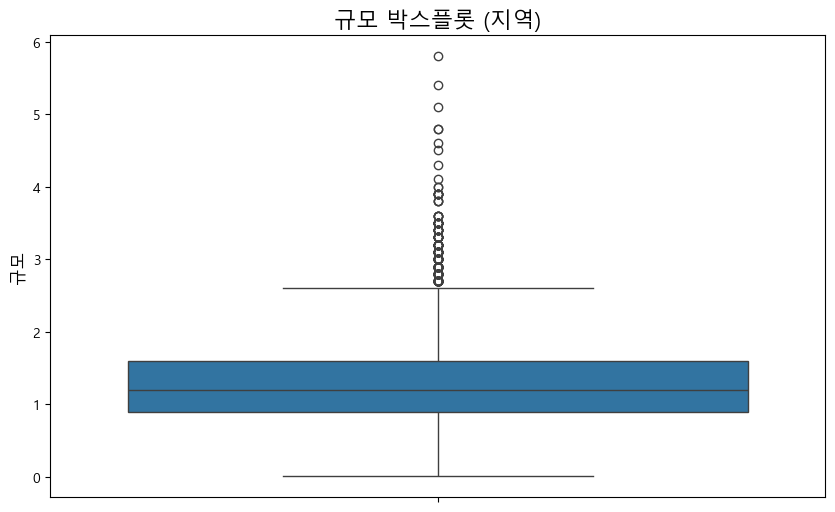

In [73]:
# 박스플롯 그리기
plt.figure(figsize=(10, 6))
sns.boxplot(y='규모', data=df_kor_inside_filtered)
plt.title('규모 박스플롯 (지역)', fontsize=16)
plt.ylabel('규모', fontsize=12)
plt.show()

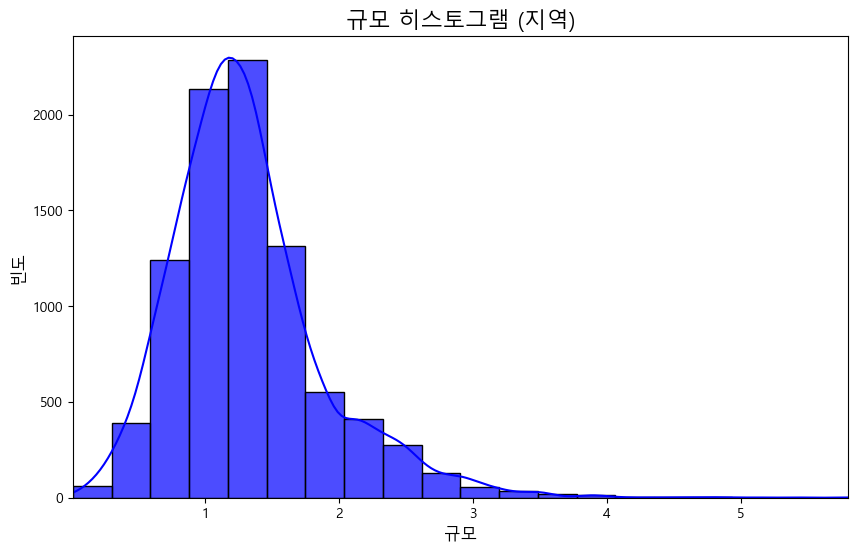

In [74]:
# 히스토그램 그리기
plt.figure(figsize=(10, 6))
sns.histplot(df_kor_inside_filtered['규모'], bins=20, kde=True, color='blue', alpha=0.7)
plt.title('규모 히스토그램 (지역)', fontsize=16)
plt.xlabel('규모', fontsize=12)
plt.ylabel('빈도', fontsize=12)
plt.xlim(df_kor_inside_filtered['규모'].min(), df_kor_inside_filtered['규모'].max())  # x축 범위 설정
plt.show()

주요 도시를 제외한 내륙 지역에 강도 높은 지진이 빈번하게 발생한다는 것을 알 수 있음

##### (6) 한국 지진 해역 지진 발생 현황

In [75]:
df_kor_sea = df_kor[df_kor['위치'].str.contains('해역')]
df_kor_sea

,발생시각,규모,깊이,진도,위도,경도,위치
2,2000-03-15 01:10:52,2.5,NaN,NaN,36.30 N,125.90 E,전북 군산시 어청도 북북서쪽 20km 해역
3,2000-03-21 13:43:56,2.3,NaN,NaN,36.50 N,126.00 E,충남 태안군 남서쪽 38km 해역
4,2000-04-12 04:44:01,3.5,NaN,NaN,36.90 N,125.30 E,충남 태안군 서격렬비열도 북북서쪽 39km 해역
6,2000-04-29 08:53:27,3.3,NaN,NaN,35.80 N,125.70 E,전북 군산시 어청도 남남서쪽 43km 해역
8,2000-05-11 10:51:18,3.1,NaN,NaN,33.30 N,125.90 E,제주 서귀포시 서쪽 57km 해역
...,...,...,...,...,...,...,...
11764,2024-11-03 12:16:44,2.0,13.0,1.0,36.46 N,129.64 E,경북 영덕군 동북동쪽 25km 해역
11766,2024-11-03 22:32:47,1.4,12.0,1.0,36.47 N,129.64 E,경북 영덕군 동북동쪽 25km 해역
11769,2024-11-04 05:47:05,1.5,18.0,1.0,36.47 N,129.63 E,경북 영덕군 동북동쪽 24km 해역
11770,2024-11-04 06:15:43,1.8,18.0,1.0,36.47 N,129.63 E,경북 영덕군 동북동쪽 24km 해역


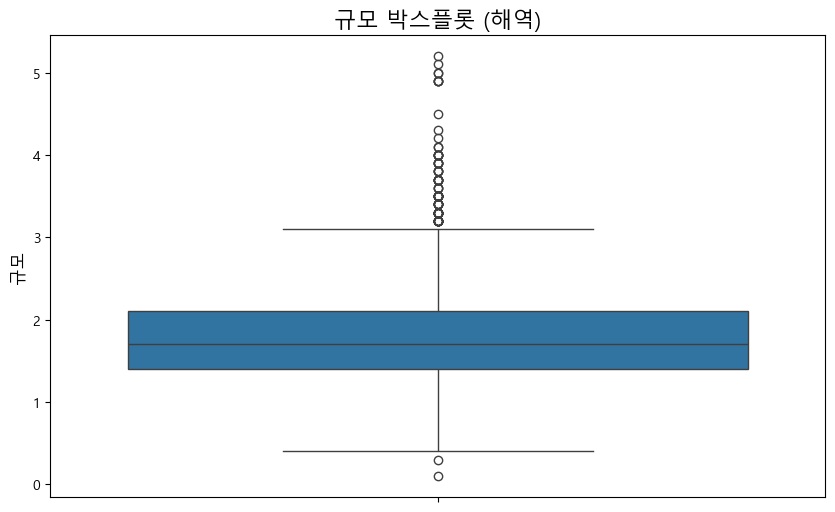

In [76]:
# 박스플롯 그리기
plt.figure(figsize=(10, 6))
sns.boxplot(y='규모', data=df_kor_sea)
plt.title('규모 박스플롯 (해역)', fontsize=16)
plt.ylabel('규모', fontsize=12)
plt.show()

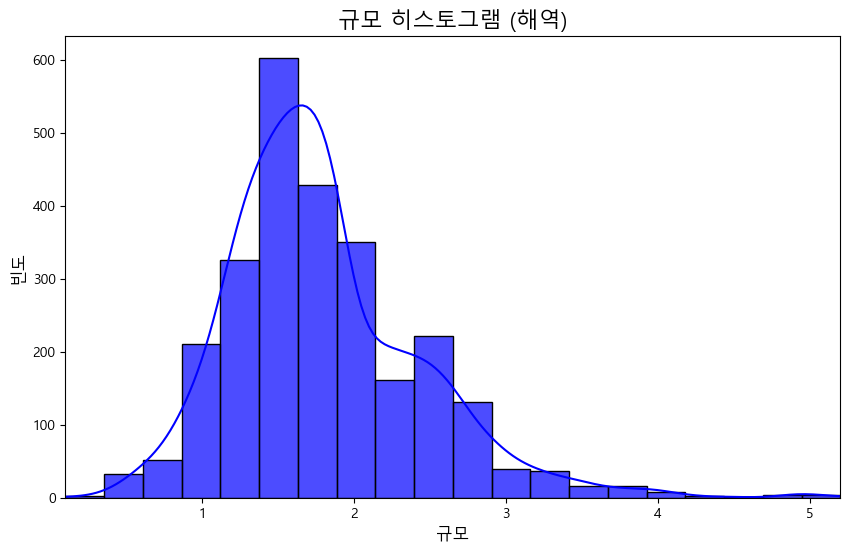

In [77]:
# 히스토그램 그리기
plt.figure(figsize=(10, 6))
sns.histplot(df_kor_sea['규모'], bins=20, kde=True, color='blue', alpha=0.7)
plt.title('규모 히스토그램 (해역)', fontsize=16)
plt.xlabel('규모', fontsize=12)
plt.ylabel('빈도', fontsize=12)
plt.xlim(df_kor_sea['규모'].min(), df_kor_sea['규모'].max())  # x축 범위 설정
plt.show()

해역 지진도 내륙 지진과 마찬가지로 4-5도의 지진이 빈번히 발생하고 있음

##### (7) 한국 지진 내륙,해역 비교

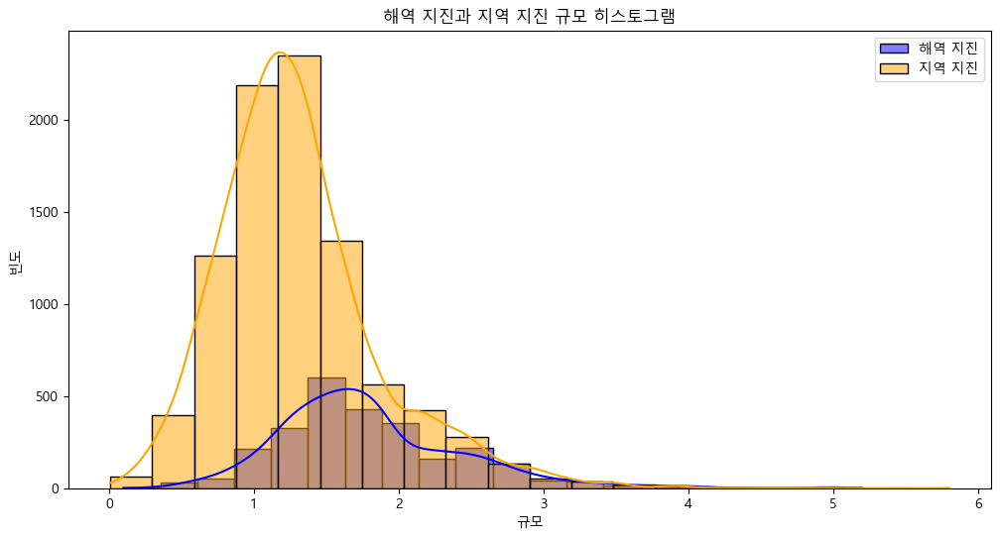

In [78]:
# 히스토그램
plt.figure(figsize=(12, 6))
sns.histplot(df_kor_sea['규모'], bins=20, kde=True, color='blue', alpha=0.5, label='해역 지진')
sns.histplot(df_kor_inside['규모'], bins=20, kde=True, color='orange', alpha=0.5, label='지역 지진')
plt.title('해역 지진과 지역 지진 규모 히스토그램')
plt.xlabel('규모')
plt.ylabel('빈도')
plt.legend()
plt.show()

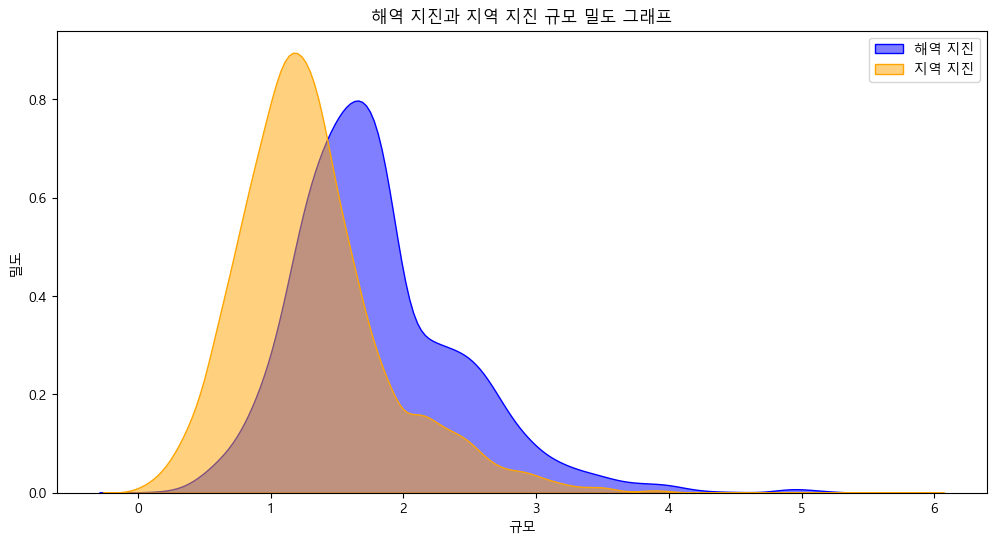

In [79]:
# 밀도 그래프 (KDE Plot)
plt.figure(figsize=(12, 6))
sns.kdeplot(df_kor_sea['규모'], color='blue', label='해역 지진', fill=True, alpha=0.5)
sns.kdeplot(df_kor_inside['규모'], color='orange', label='지역 지진', fill=True, alpha=0.5)
plt.title('해역 지진과 지역 지진 규모 밀도 그래프')
plt.xlabel('규모')
plt.ylabel('밀도')
plt.legend()
plt.show()

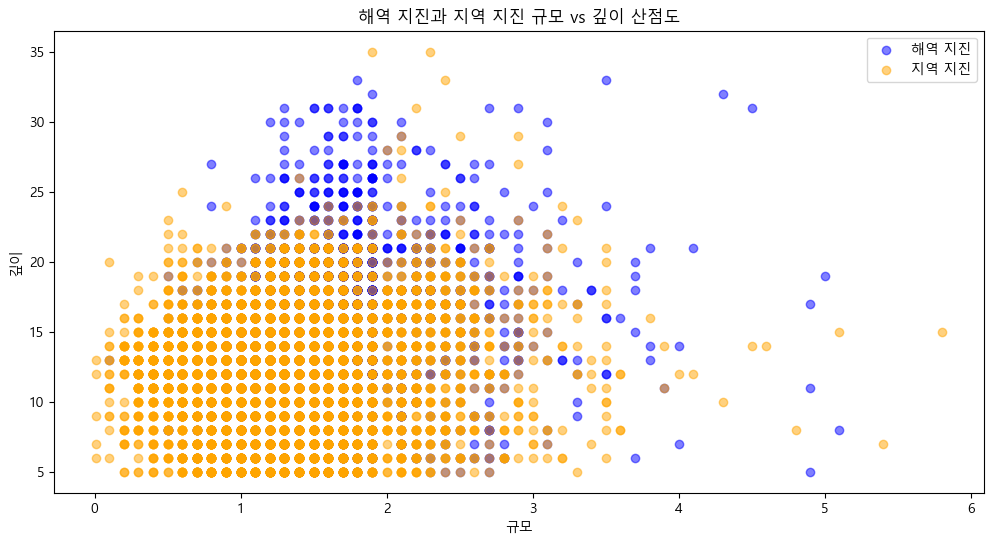

In [80]:
# 산점도 (Scatter Plot)
plt.figure(figsize=(12, 6))

# 해역 지진 산점도
plt.scatter(df_kor_sea['규모'], df_kor_sea['깊이'], color='blue', alpha=0.5, label='해역 지진')

# 지역 지진 산점도
plt.scatter(df_kor_inside['규모'], df_kor_inside['깊이'], color='orange', alpha=0.5, label='지역 지진')

plt.title('해역 지진과 지역 지진 규모 vs 깊이 산점도')
plt.xlabel('규모')
plt.ylabel('깊이')
plt.legend()
plt.show()

내륙지진은 깊이가 얕은 곳에서 주로 발생하고 해역은 깊이가 깊은 곳에서 주로 발생

##### (8) 한국 지진이 가장 빈번하게 발생하는 위치

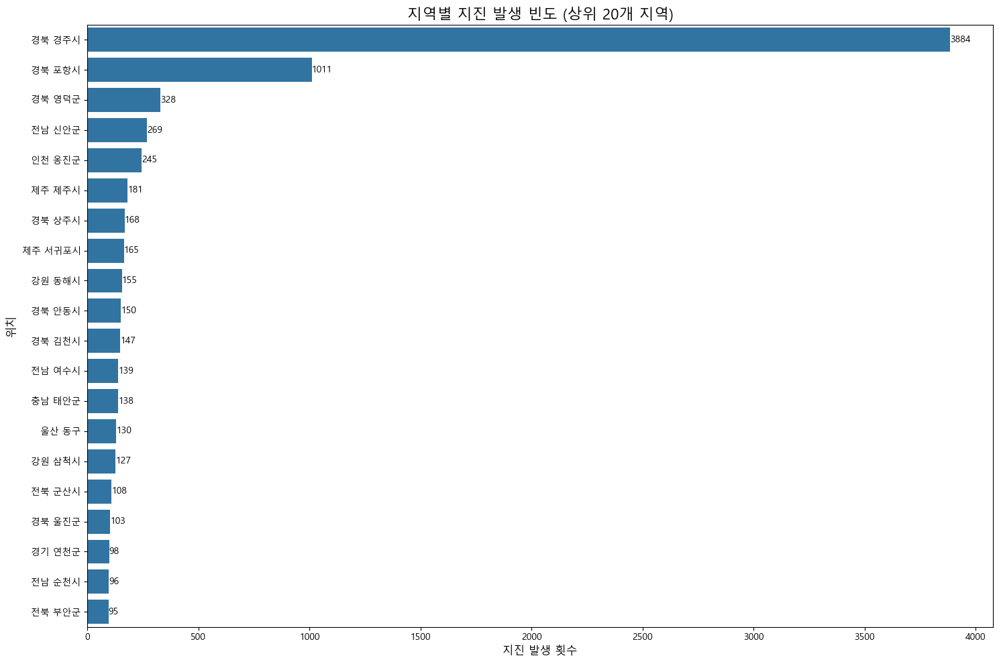

전체 위치별 지진 발생 횟수:
주요위치
경북 경주시      3884
경북 포항시      1011
경북 영덕군       328
전남 신안군       269
인천 옹진군       245
            ... 
강원도 금강군        1
평안남도 성천시       1
황해남도 옹진군       1
부산 동구          1
전남 나주시         1
Name: count, Length: 200, dtype: int64
서울에서 발생한 지진 기록이 없습니다.


In [81]:
# 위치 컬럼에서 주요 지역명만 추출 (예: '경북 경주시' 부분만 남기기)
df_kor['주요위치'] = df_kor['위치'].str.extract(r'([가-힣]+ [가-힣]+시|[가-힣]+ [가-힣]+군|[가-힣]+ [가-힣]+구)')

# 주요 위치별 지진 발생 횟수 계산
location_counts = df_kor['주요위치'].value_counts()

# 상위 20개 위치만 선택
top_20_locations = location_counts.head(20)

# 그래프 설정
plt.figure(figsize=(15, 10))
sns.barplot(x=top_20_locations.values, y=top_20_locations.index)

# 그래프 꾸미기
plt.title('지역별 지진 발생 빈도 (상위 20개 지역)', fontsize=16)
plt.xlabel('지진 발생 횟수', fontsize=12)
plt.ylabel('위치', fontsize=12)

# 각 막대에 숫자 표시
for i, v in enumerate(top_20_locations.values):
    plt.text(v + 0.1, i, str(v), va='center')

plt.tight_layout()
plt.show()

# 전체 위치별 지진 발생 횟수 출력
print("전체 위치별 지진 발생 횟수:")
print(location_counts)

# 특정 지역의 지진 발생 횟수 확인
specific_location = "서울"  # 원하는 지역명으로 변경
if specific_location in location_counts.index:
    print(f"{specific_location}의 지진 발생 횟수: {location_counts[specific_location]}")
else:
    print(f"{specific_location}에서 발생한 지진 기록이 없습니다.")

포항, 경주, 영덕 주로 동쪽에서 많은 지진에 발생함

### 2. 한국의 지진과 지질의 관계

In [82]:
df_gr = pd.read_csv('../찐최종 데이터셋/지반,지질/11년도_지질구조밀도_찐최종.csv')
df_gr

,지역,info,legend,regn_cd,위도,경도
0,전라남도 신안군 흑산면,0.50,1,46910360,34.682979,125.427371
1,전라남도 신안군 비금면,1.25,2,46910340,34.755483,125.926625
2,전라남도 신안군 도초면,2.25,3,46910350,34.703635,125.953438
3,전라남도 신안군 하의면,3.50,5,46910370,34.606818,126.036575
4,전라남도 신안군 자은면,2.75,3,46910330,34.884461,126.047405
...,...,...,...,...,...,...
2551,울산광역시 북구 당사동,0.30,2,31200116,35.593100,129.451000
2552,경상북도 울진군 기성면,1.60,2,47930350,36.798192,129.451425
2553,울산광역시 북구 구유동,0.30,2,31200112,35.604400,129.451800
2554,경상북도 경주시 양남면,0.10,1,47130320,35.677811,129.460326


In [83]:
df_gr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2556 entries, 0 to 2555
Data columns (total 6 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   지역       2556 non-null   object 
 1   info     2556 non-null   float64
 2   legend   2556 non-null   int64  
 3   regn_cd  2556 non-null   int64  
 4   위도       2556 non-null   float64
 5   경도       2556 non-null   float64
dtypes: float64(3), int64(2), object(1)
memory usage: 119.9+ KB


데이터 전처리
- info 컬럼의 값이 없는 데이터 행은 삭제
- 범위 값으로 표시된 값은 중앙값으로 대치

In [84]:
df_gr.describe(include='all')

,지역,info,legend,regn_cd,위도,경도
count,2556,2556.000000,2556.000000,2.556000e+03,2556.000000,2556.000000
unique,2356,NaN,NaN,NaN,NaN,NaN
top,경상남도 창원시 마산합포구,NaN,NaN,NaN,NaN,NaN
freq,64,NaN,NaN,NaN,NaN,NaN
mean,NaN,0.482251,1.774648,3.392502e+07,36.251420,127.650144
std,NaN,0.609553,0.907071,1.328621e+07,0.998416,0.879958
min,NaN,0.003500,1.000000,1.111010e+07,34.025700,125.427371
25%,NaN,0.150000,1.000000,2.711012e+07,35.223461,126.930578
50%,NaN,0.300000,2.000000,3.120012e+07,36.041630,127.291650
75%,NaN,0.750000,2.000000,4.617026e+07,37.465346,128.584855


일반적 통계
- 총 2556개의 지역
- 각 지역의 지질구조밀도의 평균은 0.4로 지반이 안좋아 보임
- 지질구조밀도의 최댓값은 5 최솟값은 0.003

##### (1) 지역별 평균 지질구조밀도

C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_2144\3461305914.py:17: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=90)
C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_2144\3461305914.py:17: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=90)
C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_2144\3461305914.py:17: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=90)
C:\Users\Public\Documents\ESTsoft\CreatorTemp\ipykernel_2144\3461305914.py:17: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks()

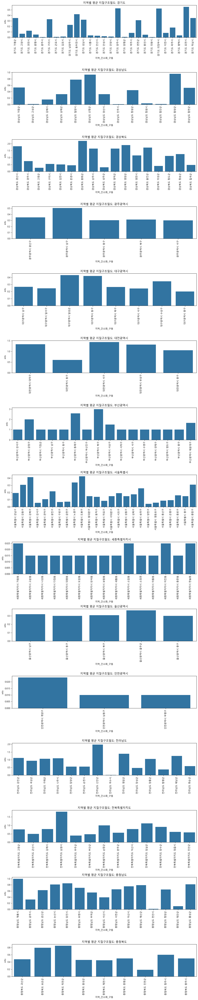

In [85]:

# 지역_간소화_시도 열 추가
df_gr['지역_간소화_시도'] = df_gr['지역'].apply(lambda x: ' '.join(x.split()[:1]))
df_gr['지역_간소화_구동'] = df_gr['지역'].apply(lambda x: ' '.join(x.split()[:2]))

# 지역별 평균 지질구조밀도 계산
지역별_평균 = df_gr.groupby(['지역_간소화_시도', '지역_간소화_구동'])['info'].mean().reset_index()

# 고유한 지역_간소화_시도 값에 따라 서브플롯 생성
unique_지역 = 지역별_평균['지역_간소화_시도'].unique()
num_plots = len(unique_지역)
fig, axes = plt.subplots(num_plots, 1, figsize=(12, 4 * num_plots))

# 각 서브플롯에 데이터 나누어 그리기
for i, 지역 in enumerate(unique_지역):
    sns.barplot(x='지역_간소화_구동', y='info', data=지역별_평균[지역별_평균['지역_간소화_시도'] == 지역], ax=axes[i])
    axes[i].set_title(f'지역별 평균 지질구조밀도: {지역}')
    axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=90)

plt.tight_layout()  # 레이아웃 조정
plt.show()

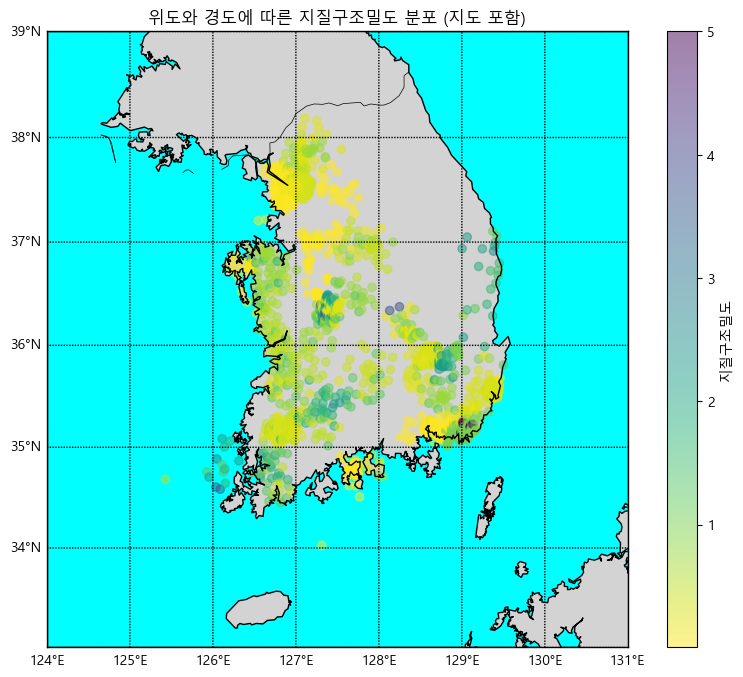

In [86]:
from mpl_toolkits.basemap import Basemap

# 지도 설정 및 그리기
plt.figure(figsize=(10, 8))

# Basemap 설정 (대한민국 중심)
m = Basemap(projection='merc', 
            llcrnrlat=33, urcrnrlat=39,  # 남북 범위
            llcrnrlon=124, urcrnrlon=131,  # 동서 범위
            resolution='i')  # 지도 해상도

# 지도 그리기
m.drawcoastlines()
m.drawcountries()
m.drawmapboundary(fill_color='aqua')
m.fillcontinents(color='lightgray', lake_color='aqua')
m.drawparallels(np.arange(33., 40., 1.), labels=[1,0,0,0], fontsize=10)
m.drawmeridians(np.arange(124., 132., 1.), labels=[0,0,0,1], fontsize=10)

# 경도와 위도를 Basemap 좌표로 변환
x, y = m(df_gr['경도'].values, df_gr['위도'].values)

# 산점도 그리기 (지질구조밀도에 따라 색상 지정)
sc = plt.scatter(x, y, c=df_gr['info'], cmap='viridis_r', alpha=0.5)  # cmap 반전

# 컬러바 추가
plt.colorbar(sc, label='지질구조밀도')

# 제목과 축 레이블 설정
plt.title('위도와 경도에 따른 지질구조밀도 분포 (지도 포함)')
plt.show()

지도에 시각화까지 진행하였고 연할수록 밀도가 낮고 진할수록 밀도가 높음

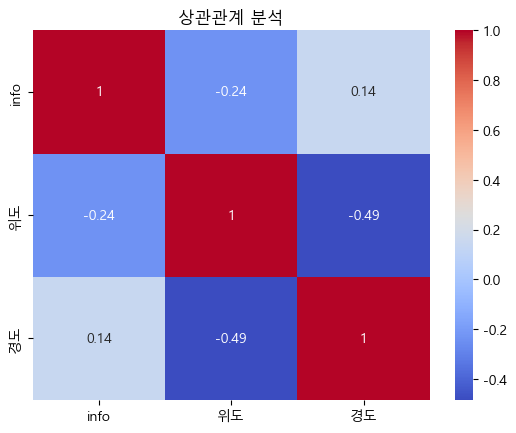

In [87]:
correlation = df_gr[['info', '위도', '경도']].corr()
sns.heatmap(correlation, annot=True, cmap='coolwarm')
plt.title('상관관계 분석')
plt.show()

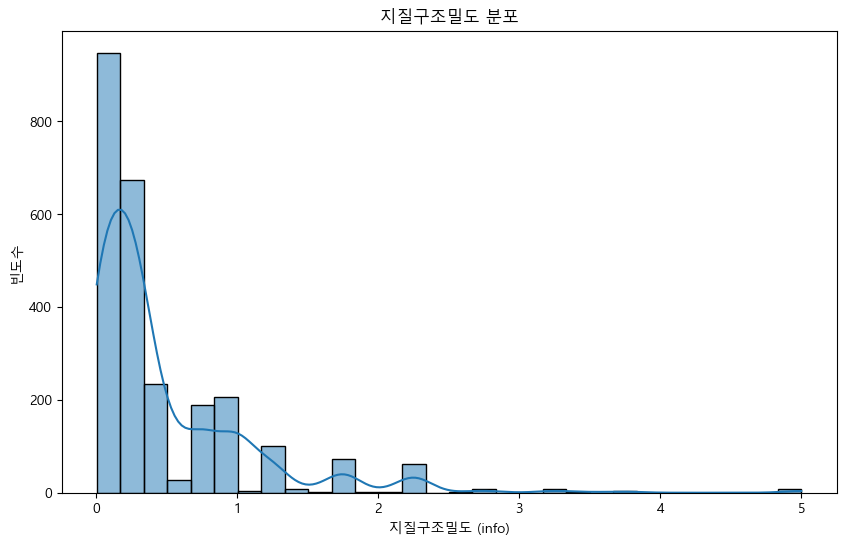

In [88]:
plt.figure(figsize=(10, 6))
sns.histplot(df_gr['info'], bins=30, kde=True)
plt.title('지질구조밀도 분포')
plt.xlabel('지질구조밀도 (info)')
plt.ylabel('빈도수')
plt.show()

히스토그램으로 분포를 확인해보면 지도상에 표시된 지역은 대부분 지반이 약함

In [89]:
# Folium 맵 생성
m = folium.Map(location=[df_gr['위도'].mean(), df_gr['경도'].mean()], zoom_start=7)

# 색상 설정 함수
def get_color(density):
    if density < 1.5:
        return 'red'
    elif density < 2.5:
        return 'yellow'
    elif density < 3.5:
        return 'orange'
    else:
        return 'green'

# CircleMarker 추가
for idx, row in df_gr.iterrows():
    folium.CircleMarker(
        location=(row['위도'], row['경도']),
        radius=row['info'] * 5,  # 반지름을 조정
        color=get_color(row['info']),  # 색상 결정
        fill=True,
        fill_opacity=0.5
    ).add_to(m)

m

빨간색 부분일 수록 지반이 약함

##### (2) 지역별 지진과 지질밀도 시각화

In [90]:
from folium import Icon

# 지진 데이터 로드
df_kor = pd.read_csv('..\찐최종 데이터셋\지진\시계열_한국_지진데이터_찐최종.csv')
df_kor['위도'] = df_kor['위도'].str.replace(' N', '').astype(float)
df_kor['경도'] = df_kor['경도'].str.replace(' E', '').astype(float)
df_kor.dropna(subset=['위도', '경도'], inplace=True)
df_kor_filtered = df_kor[df_kor['규모'] >= 4.0]

# Folium 맵 생성
m = folium.Map(location=[36.5, 127.5], zoom_start=7)  # 한국의 중심 좌표

# 지진 발생 위치 마커 추가
for idx, row in df_kor_filtered.iterrows():
    folium.Marker(
        location=(row['위도'], row['경도']),
        icon=Icon(color='blue', icon='star', prefix='fa'),  # 별모양 아이콘
        popup=f"규모: {row['규모']}<br>발생 시각: {row['발생시각']}"  # 팝업 정보
    ).add_to(m)

# 색상 설정 함수
def get_color(density):
    if density < 1.5:
        return 'red'
    elif density < 2.5:
        return 'yellow'
    elif density < 3.5:
        return 'orange'
    else:
        return 'green'



# 지질구조밀도 CircleMarker 추가
for idx, row in df_gr.iterrows():
    folium.CircleMarker(
        location=(row['위도'], row['경도']),
        radius=row['info'] * 5,  # 반지름을 조정
        color=get_color(row['info']),  # 색상 결정
        fill=True,
        fill_opacity=0.5,
        popup=f"밀도: {row['info']}"  # 팝업 정보
    ).add_to(m)

m

규모가 4이상인 지진이 발생한 곳과 지질밀도 시각화

In [91]:
df_kor_filtered = df_kor[df_kor['규모'] >= 4.0]

# Folium 맵 생성
m = folium.Map(location=[36.5, 127.5], zoom_start=7)  # 한국의 중심 좌표

# 지진 발생 위치 마커 추가
for idx, row in df_kor_filtered.iterrows():
    folium.Marker(
        location=(row['위도'], row['경도']),
        icon=Icon(color='blue', icon='star', prefix='fa'),  # 별모양 아이콘
        popup=f"규모: {row['규모']}<br>발생 시각: {row['발생시각']}"  # 팝업 정보
    ).add_to(m)

# 색상 설정 함수
def get_color(density):
    if density < 1.5:
        return 'red'
    elif density < 2.5:
        return 'yellow'
    elif density < 3.5:
        return 'orange'
    else:
        return 'green'



# 지질구조밀도 CircleMarker 추가
for idx, row in df_gr.iterrows():
    folium.CircleMarker(
        location=(row['위도'], row['경도']),
        radius=row['info'] * 5,  # 반지름을 조정
        color=get_color(row['info']),  # 색상 결정
        fill=True,
        fill_opacity=0.5,
        popup=f"밀도: {row['info']}"  # 팝업 정보
    ).add_to(m)

m

규모가 3이상인 지진이 발생한 곳과 지질밀도 시각화

지도를 보면 3이상 규모의 지진은 아직 수도권 같은 주요 내륙 도시에 발생하지 않음 -> 만약 발생한다면 피해가 있을 수 있음

### 3. 한국의 기후의 관계

In [92]:
df_tp = pd.read_csv('..\찐최종 데이터셋\기후\연도별_국내태풍수_찐최종.csv', encoding='euc-kr')
df_tp = df_tp[49:]
df_tp

,년,1월,2월,3월,4월,5월,6월,7월,8월,9월,10월,11월,12월,연합계
49,2000,0,0,0,0,0,0,2,2,1,0,0,0,5
50,2001,0,0,0,0,0,0,0,1,0,0,0,0,1
51,2002,0,0,0,0,0,1,2,1,0,0,0,0,4
52,2003,0,0,0,0,1,1,0,1,1,0,0,0,4
53,2004,0,0,0,0,0,1,1,3,0,0,0,0,5
54,2005,0,0,0,0,0,0,0,1,0,0,0,0,1
55,2006,0,0,0,0,0,0,1,1,1,0,0,0,3
56,2007,0,0,0,0,0,0,2,0,1,0,0,0,3
57,2008,0,0,0,0,0,0,1,0,0,0,0,0,1
58,2009,0,0,0,0,0,0,0,0,0,0,0,0,0


In [93]:
df_tp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24 entries, 49 to 72
Data columns (total 14 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   년       24 non-null     int64
 1   1월      24 non-null     int64
 2   2월      24 non-null     int64
 3   3월      24 non-null     int64
 4   4월      24 non-null     int64
 5   5월      24 non-null     int64
 6   6월      24 non-null     int64
 7   7월      24 non-null     int64
 8   8월      24 non-null     int64
 9   9월      24 non-null     int64
 10  10월     24 non-null     int64
 11  11월     24 non-null     int64
 12  12월     24 non-null     int64
 13  연합계     24 non-null     int64
dtypes: int64(14)
memory usage: 2.8 KB


In [94]:
df_tp.describe()

,년,1월,2월,3월,4월,5월,6월,7월,8월,9월,10월,11월,12월,연합계
count,24.000000,24.0,24.0,24.0,24.0,24.000000,24.000000,24.000000,24.000000,24.000000,24.000000,24.0,24.0,24.000000
mean,2011.500000,0.0,0.0,0.0,0.0,0.041667,0.291667,1.000000,1.166667,0.708333,0.083333,0.0,0.0,3.333333
std,7.071068,0.0,0.0,0.0,0.0,0.204124,0.464306,1.021508,1.007220,0.806450,0.282330,0.0,0.0,1.685402
min,2000.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000
25%,2005.750000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,2.750000
50%,2011.500000,0.0,0.0,0.0,0.0,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.0,0.0,3.500000
75%,2017.250000,0.0,0.0,0.0,0.0,0.000000,1.000000,2.000000,2.000000,1.000000,0.000000,0.0,0.0,4.250000
max,2023.000000,0.0,0.0,0.0,0.0,1.000000,1.000000,3.000000,3.000000,3.000000,1.000000,0.0,0.0,7.000000


##### (1) 역대 월별 태풍 발생 현황

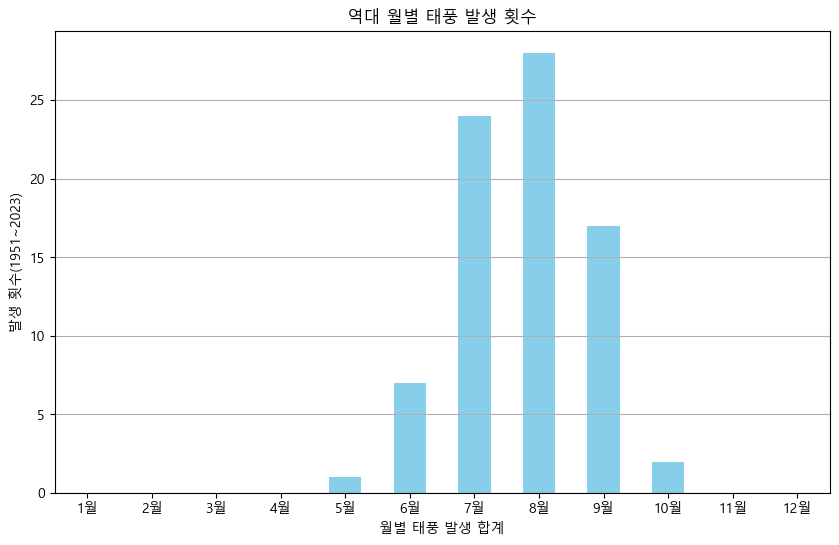

In [95]:
column_sums = df_tp.drop(columns=['년','연합계']).sum()
plt.figure(figsize=(10, 6))
column_sums.plot(kind='bar', color='skyblue')
plt.title('역대 월별 태풍 발생 횟수')
plt.xlabel('월별 태풍 발생 합계')
plt.ylabel('발생 횟수(1951~2023)')
plt.xticks(rotation=0)  # x축 라벨 회전
plt.grid(axis='y')
plt.show()

6~9월에 많이 발생함

##### (2) 역대 월별 강수발생 현황

In [96]:
df_rain = pd.read_csv('../찐최종 데이터셋/기후/연도별_한국_평균강수일수_찐최종.csv')
df_rain

,연도,1월,2월,3월,4월,5월,6월,7월,8월,9월,10월,11월,12월,연합계
0,2000,10.4,3.7,5.5,6.8,8.7,11.8,10.8,14.8,11.5,5.6,6.6,5.6,101.8
1,2001,9.7,6.9,6.4,4.6,6.5,11.4,13.2,9.8,5.7,8.1,3.8,6.6,92.6
2,2002,9.8,2.6,7.1,7.0,10.6,7.0,13.4,17.9,7.0,8.9,5.4,9.5,106.2
3,2003,7.2,7.1,9.1,11.3,8.3,9.6,20.5,16.9,11.1,4.5,10.8,4.5,120.9
4,2004,5.9,7.1,5.8,7.3,14.0,9.5,13.8,12.0,13.1,2.5,6.8,4.8,102.8
5,2005,5.7,6.7,8.2,7.1,6.8,9.3,14.0,16.2,11.8,6.0,5.0,7.0,103.7
6,2006,4.1,8.0,5.9,10.6,9.7,10.2,21.8,10.5,6.9,3.4,7.9,5.9,105.0
7,2007,4.4,4.8,11.1,6.9,9.0,10.4,14.4,17.4,17.0,7.3,3.7,8.9,115.1
8,2008,6.7,3.1,8.8,8.9,8.2,12.1,15.0,12.6,8.7,4.9,6.8,6.4,102.2
9,2009,5.7,6.1,8.8,6.6,9.5,10.5,19.1,10.7,7.3,6.0,7.6,8.3,106.2


In [97]:
df_rain.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25 entries, 0 to 24
Data columns (total 14 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   연도      25 non-null     int64  
 1   1월      25 non-null     float64
 2   2월      25 non-null     float64
 3   3월      25 non-null     float64
 4   4월      25 non-null     float64
 5   5월      25 non-null     float64
 6   6월      25 non-null     float64
 7   7월      25 non-null     float64
 8   8월      25 non-null     float64
 9   9월      25 non-null     float64
 10  10월     25 non-null     float64
 11  11월     25 non-null     float64
 12  12월     24 non-null     float64
 13  연합계     25 non-null     float64
dtypes: float64(13), int64(1)
memory usage: 2.9 KB


In [98]:
df_rain.describe()

,연도,1월,2월,3월,4월,5월,6월,7월,8월,9월,10월,11월,12월,연합계
count,25.000000,25.000000,25.000000,25.000000,25.000000,25.000000,25.000000,25.000000,25.000000,25.000000,25.000000,25.000000,24.000000,25.000000
mean,2012.000000,6.492000,6.148000,7.748000,8.508000,8.716000,9.996000,15.360000,13.860000,9.976000,6.248000,7.180000,7.241667,107.208000
std,7.359801,2.032429,2.395677,2.448319,2.258857,2.430994,1.424921,3.270321,3.414918,2.894431,2.109328,2.895686,2.032329,8.552579
min,2000.000000,2.900000,2.600000,3.600000,4.600000,3.300000,7.000000,7.900000,8.300000,5.400000,2.500000,2.100000,3.600000,90.900000
25%,2006.000000,5.500000,4.500000,5.800000,6.900000,7.400000,9.300000,13.600000,10.700000,7.200000,5.000000,5.400000,5.975000,102.200000
50%,2012.000000,6.400000,6.100000,8.000000,8.400000,8.700000,10.200000,14.400000,14.800000,11.100000,6.000000,6.800000,6.850000,106.200000
75%,2018.000000,7.200000,7.100000,9.100000,10.400000,9.700000,11.300000,17.700000,16.700000,11.900000,7.300000,8.300000,8.525000,113.300000
max,2024.000000,10.400000,13.200000,14.100000,14.100000,14.400000,12.100000,21.800000,19.000000,17.000000,11.000000,15.400000,11.200000,127.300000


일반적 통계
- 강수 일수는 8, 9월에 많음

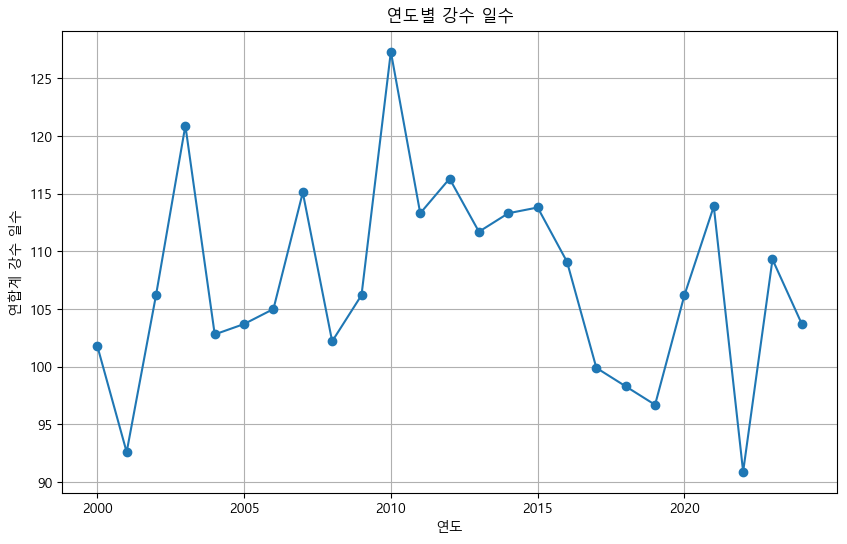

In [99]:
# 라인플롯 그리기
plt.figure(figsize=(10, 6))
plt.plot(df_rain['연도'], df_rain['연합계'], marker='o')
plt.title('연도별 강수 일수')
plt.xlabel('연도')
plt.ylabel('연합계 강수 일수')

# 5년 단위로 x축 눈금 설정
plt.xticks(range(df_rain['연도'].min(), df_rain['연도'].max() + 1, 5)) 

plt.grid(True)
plt.show()

강수 일수가 2003년과 2010년에 많았음

### 4. 한국의 지진과 일본 지진과의 관련성

In [117]:
df_abroad = pd.read_csv('../찐최종 데이터셋/지진/시계열_해외_지진데이터_찐최종.csv')
df_abroad

,발생시각,규모,깊이(km),위도,경도,위치
0,2000-10-06 13:30:00,7.3,NaN,35.30 N,133.40 E,일본 톳도리현 서쪽 약 80km 지역(히로시마 북동쪽 약 140km 지역)
1,2001-03-24 15:28:16,6.4,NaN,34.10 N,132.60 E,일본 히로시마 남남동쪽 약 50km해역
2,2002-11-21 06:32:31,6.4,NaN,35.40 N,74.52 E,파키스탄 카쉬미르
3,2002-11-17 13:53:51,7.3,NaN,47.98 N,146.29 E,쿠릴섬 북서 해역
4,2002-11-04 07:12:41,7.9,NaN,63.74 N,147.69 W,알래스카 중부
...,...,...,...,...,...,...
2012,2024-01-09 05:48:43,6.7,70.0,4.86 N,126.19 E,필리핀 제너럴산토스 남동쪽 179km 해역
2013,2024-01-06 05:26:00,5.3,10.0,37.20 N,136.80 E,일본 도야마현(혼슈) 도야마 북북서쪽 67km 지역
2014,2024-01-04 17:16:00,5.0,10.0,37.80 N,137.60 E,일본 니이가타현(혼슈) 니이가타 서쪽 125km 해역
2015,2024-01-03 10:54:00,5.5,10.0,37.40 N,136.90 E,일본 도야마현(혼슈) 도야마 북북서쪽 83km 지역


In [118]:
df_jap = df_abroad[df_abroad['위치'].str.contains('일본')]
df_jap

,발생시각,규모,깊이(km),위도,경도,위치
0,2000-10-06 13:30:00,7.3,NaN,35.30 N,133.40 E,일본 톳도리현 서쪽 약 80km 지역(히로시마 북동쪽 약 140km 지역)
1,2001-03-24 15:28:16,6.4,NaN,34.10 N,132.60 E,일본 히로시마 남남동쪽 약 50km해역
42,2003-10-31 10:06:28,7.0,NaN,37.81 N,142.62 E,일본 혼슈 동해안
46,2003-09-26 06:08:00,7.4,NaN,41.77 N,143.59 E,일본 혼슈
47,2003-09-26 04:50:06,8.3,NaN,41.82 N,143.91 E,일본 혼슈
...,...,...,...,...,...,...
2011,2024-01-09 17:59:00,6.0,10.0,37.90 N,137.80 E,일본 니이가타현(혼슈) 니이가타 서쪽 107km 해역
2013,2024-01-06 05:26:00,5.3,10.0,37.20 N,136.80 E,일본 도야마현(혼슈) 도야마 북북서쪽 67km 지역
2014,2024-01-04 17:16:00,5.0,10.0,37.80 N,137.60 E,일본 니이가타현(혼슈) 니이가타 서쪽 125km 해역
2015,2024-01-03 10:54:00,5.5,10.0,37.40 N,136.90 E,일본 도야마현(혼슈) 도야마 북북서쪽 83km 지역


일본에서 발생한 규모 5이상 지진의 데이터프레임

##### 일본의 지진은 한국의 지진에 영향을 주는가?

In [115]:
df_jap

,발생시각,규모,깊이,위도,경도,위치
0,2000-10-06 13:30:00,7.3,NaN,35.30 N,133.40 E,일본 톳도리현 서쪽 약 80km 지역(히로시마 북동쪽 약 140km 지역)
1,2001-03-24 15:28:16,6.4,NaN,34.10 N,132.60 E,일본 히로시마 남남동쪽 약 50km해역
42,2003-10-31 10:06:28,7.0,NaN,37.81 N,142.62 E,일본 혼슈 동해안
46,2003-09-26 06:08:00,7.4,NaN,41.77 N,143.59 E,일본 혼슈
47,2003-09-26 04:50:06,8.3,NaN,41.82 N,143.91 E,일본 혼슈
...,...,...,...,...,...,...
2011,2024-01-09 17:59:00,6.0,10.0,37.90 N,137.80 E,일본 니이가타현(혼슈) 니이가타 서쪽 107km 해역
2013,2024-01-06 05:26:00,5.3,10.0,37.20 N,136.80 E,일본 도야마현(혼슈) 도야마 북북서쪽 67km 지역
2014,2024-01-04 17:16:00,5.0,10.0,37.80 N,137.60 E,일본 니이가타현(혼슈) 니이가타 서쪽 125km 해역
2015,2024-01-03 10:54:00,5.5,10.0,37.40 N,136.90 E,일본 도야마현(혼슈) 도야마 북북서쪽 83km 지역


In [125]:
from datetime import timedelta

# 일본 지진 데이터
japan_earthquakes = pd.DataFrame({
    '발생시각': ['2019-06-18 22:22:00', '2022-01-22 01:08:00', '2023-05-05 14:42:00', 
                 '2024-04-17 23:14:00', '2024-01-09 17:59:00'],
    '규모': [6.8, 6.4, 6.3, 6.4, 6.0]
})
japan_earthquakes['발생시각'] = pd.to_datetime(japan_earthquakes['발생시각'])

# 한국 지진 데이터 로드
df_korea = pd.read_csv('../찐최종 데이터셋/지진/시계열_한국_지진데이터_찐최종.csv')
df_korea['발생시각'] = pd.to_datetime(df_korea['발생시각'])

# 규모와 깊이를 숫자로 변환
df_korea['규모'] = pd.to_numeric(df_korea['규모'], errors='coerce')
df_korea['깊이(km)'] = pd.to_numeric(df_korea['깊이'], errors='coerce')

# 일본 지진 발생 후 7일 이내의 한국 지진 찾기
def find_related_earthquakes(japan_quake, korea_df, days=7):
    start_time = japan_quake['발생시각']
    end_time = start_time + timedelta(days=days)
    related_quakes = korea_df[(korea_df['발생시각'] > start_time) & (df_korea['발생시각'] <= end_time)]
    return related_quakes

# 각 일본 지진에 대해 관련된 한국 지진 찾기
for _, japan_quake in japan_earthquakes.iterrows():
    print(f"\n일본 지진 발생: {japan_quake['발생시각']} (규모 {japan_quake['규모']})")
    related_quakes = find_related_earthquakes(japan_quake, df_korea)
    
    if len(related_quakes) > 0:
        print("관련된 한국 지진:")
        for _, korea_quake in related_quakes.iterrows():
            time_diff = korea_quake['발생시각'] - japan_quake['발생시각']
            try:
                print(f"  - {korea_quake['발생시각']} (규모 {korea_quake['규모']:.1f}, "
                      f"깊이 {korea_quake['깊이(km)']:.1f}km, 위치: {korea_quake['위치']}, "
                      f"일본 지진 후 {time_diff.total_seconds() / 3600:.1f}시간 후)")
            except ValueError:
                print(f"  - {korea_quake['발생시각']} (규모 {korea_quake['규모']}, "
                      f"깊이 {korea_quake['깊이(km)']}km, 위치: {korea_quake['위치']}, "
                      f"일본 지진 후 {time_diff.total_seconds() / 3600:.1f}시간 후)")
    else:
        print("7일 이내에 관련된 한국 지진 없음")

# 통계 정보 출력
total_related_quakes = sum(len(find_related_earthquakes(quake, df_korea)) for _, quake in japan_earthquakes.iterrows())
print(f"\n총 관련 한국 지진 수: {total_related_quakes}")
print(f"분석된 일본 지진 수: {len(japan_earthquakes)}")


일본 지진 발생: 2019-06-18 22:22:00 (규모 6.8)
관련된 한국 지진:
  - 2019-06-19 02:45:00 (규모 1.6, 깊이 9.0km, 위치: 인천 옹진군 백령도 북서쪽 3km 지역, 일본 지진 후 4.4시간 후)
  - 2019-06-19 05:57:41 (규모 0.9, 깊이 8.0km, 위치: 인천 옹진군 백령도 서북서쪽 4km 해역, 일본 지진 후 7.6시간 후)
  - 2019-06-19 08:55:56 (규모 0.9, 깊이 9.0km, 위치: 인천 옹진군 백령도 서북서쪽 4km 지역, 일본 지진 후 10.6시간 후)
  - 2019-06-19 08:56:16 (규모 0.7, 깊이 9.0km, 위치: 인천 옹진군 백령도 서북서쪽 4km 해역, 일본 지진 후 10.6시간 후)
  - 2019-06-20 00:42:38 (규모 0.7, 깊이 9.0km, 위치: 인천 옹진군 백령도 서북서쪽 4km 해역, 일본 지진 후 26.3시간 후)
  - 2019-06-20 05:19:28 (규모 1.4, 깊이 12.0km, 위치: 충남 태안군 서격렬비도 북서쪽 77km 해역, 일본 지진 후 31.0시간 후)
  - 2019-06-20 12:10:48 (규모 1.5, 깊이 16.0km, 위치: 충남 당진시 서북서쪽 16km 지역, 일본 지진 후 37.8시간 후)
  - 2019-06-20 12:54:23 (규모 0.5, 깊이 8.0km, 위치: 인천 옹진군 백령도 서북서쪽 4km 지역, 일본 지진 후 38.5시간 후)
  - 2019-06-20 17:01:15 (규모 0.6, 깊이 14.0km, 위치: 인천 옹진군 백령도 서북서쪽 2km 지역, 일본 지진 후 42.7시간 후)
  - 2019-06-20 17:47:06 (규모 0.9, 깊이 16.0km, 위치: 경북 영덕군 북동쪽 24km 해역, 일본 지진 후 43.4시간 후)
  - 2019-06-21 05:07:16 (규모 1.2, 깊이 9.0km, 위치: 인천 옹진군 백령도 서북서쪽 

일본 서부에서 발생한 지진 중 진도 6이상의 지진 중 일주일 이내에 국내에서 지진이 발생했는가에 대한 내용입니다. 동해안에서 발생한 지진은 관측되지 않았으며, 규모도 인간이 느낄 수 없는 정도였습니다.

한국의 지진 현황과 어떤요인이 작용할 수 있는지 알아봤습니다. 한국처럼 판의 경계에 속하지 않고 갑자기 지진이 늘어난 다른 지역의 사례가 있을까요? 한번 알아봅시다.

### 5. 한국의 지진과 비슷한 오클라호마 지진

In [ ]:
df_okc = pd.read_csv('..\찐최종 데이터셋\지진\시계열_오클라호마_지진데이터_찐최종.csv')
df_okc

,발생시각,규모,진도,위도,경도,깊이
0,1918-09-10 16:30:00,3.4,5.0,35.500000,-98.000000,5.00
1,1918-09-11 06:30:00,3.4,6.0,35.500000,-98.000000,5.00
2,1926-06-20 14:20:00,4.3,5.0,35.600000,-94.900000,5.00
3,1929-12-28 00:30:00,4.0,6.0,35.500000,-98.000000,5.00
4,1933-08-19 19:30:00,3.3,5.0,35.500000,-98.000000,5.00
...,...,...,...,...,...,...
28002,2024-10-20 10:45:20,2.5,NaN,34.751333,-97.566000,10.69
28003,2024-10-28 05:23:13,2.6,NaN,35.086500,-95.519000,7.46
28004,2024-10-28 16:14:52,2.6,NaN,36.468667,-98.803667,6.35
28005,2024-10-28 17:31:44,2.7,NaN,36.464500,-98.803833,6.70


In [ ]:
df_kor = pd.read_csv('..\찐최종 데이터셋\지진\시계열_한국_지진데이터_찐최종.csv')
df_kor

,발생시각,규모,깊이,진도,위도,경도,위치
0,2000-01-18 15:08:50,3.0,NaN,NaN,38.70 N,127.90 E,북한 강원 회양 동쪽 26km 지역
1,2000-02-21 01:06:31,2.1,NaN,NaN,35.80 N,128.20 E,경북 고령군 북서쪽 10km 지역
2,2000-03-15 01:10:52,2.5,NaN,NaN,36.30 N,125.90 E,전북 군산시 어청도 북북서쪽 20km 해역
3,2000-03-21 13:43:56,2.3,NaN,NaN,36.50 N,126.00 E,충남 태안군 남서쪽 38km 해역
4,2000-04-12 04:44:01,3.5,NaN,NaN,36.90 N,125.30 E,충남 태안군 서격렬비열도 북북서쪽 39km 해역
...,...,...,...,...,...,...,...
11769,2024-11-04 05:47:05,1.5,18.0,1.0,36.47 N,129.63 E,경북 영덕군 동북동쪽 24km 해역
11770,2024-11-04 06:15:43,1.8,18.0,1.0,36.47 N,129.63 E,경북 영덕군 동북동쪽 24km 해역
11771,2024-11-04 07:34:00,1.3,18.0,1.0,38.63 N,127.52 E,북한 강원 회양 남서쪽 11km 지역
11772,2024-11-04 09:22:39,1.3,13.0,1.0,35.75 N,129.18 E,경북 경주시 남남서쪽 12km 지역


In [ ]:
df_okc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28007 entries, 0 to 28006
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   발생시각    28007 non-null  object 
 1   규모      28007 non-null  float64
 2   진도      23297 non-null  float64
 3   위도      28007 non-null  float64
 4   경도      28007 non-null  float64
 5   깊이      28007 non-null  float64
dtypes: float64(5), object(1)
memory usage: 1.3+ MB


결측치 처리
- 진도 컬럼에만 결측치 존재 -> 진도 컬럼을 사용하지 않음

In [ ]:
df_okc.describe(include='all')

,발생시각,규모,진도,위도,경도,깊이
count,28007,28007.000000,23297.000000,28007.000000,28007.000000,28007.000000
unique,27922,NaN,NaN,NaN,NaN,NaN
top,2018-10-26 08:39:19,NaN,NaN,NaN,NaN,NaN
freq,3,NaN,NaN,NaN,NaN,NaN
mean,NaN,2.449698,0.408765,36.135964,-97.631574,5.583600
std,NaN,0.394589,1.102809,0.630616,0.726501,2.234269
min,NaN,2.000000,0.000000,33.165138,-103.164246,0.000000
25%,NaN,2.200000,0.000000,35.774460,-98.050555,4.860000
50%,NaN,2.400000,0.000000,36.278240,-97.549500,5.323000
75%,NaN,2.600000,0.000000,36.601345,-97.247835,6.561000


일반적 통계
- 규모의 최댓값은 5.8, 최솟값은 2.0
- 오클라호마지진 데이터셋은 규모 2미만의 지진은 기록되어 있지않음

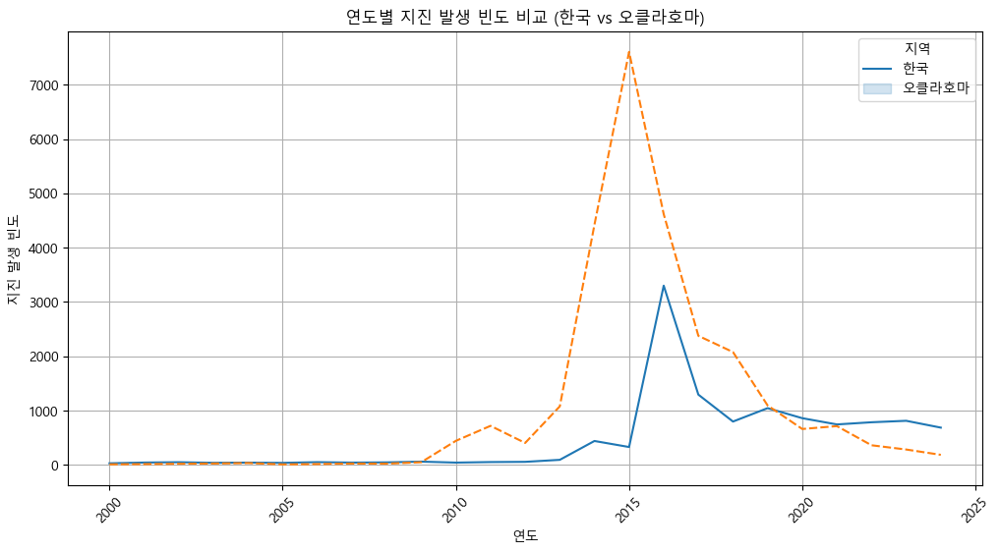

In [ ]:
df_kor['발생시각'] = pd.to_datetime(df_kor['발생시각'])
df_okc['발생시각'] = pd.to_datetime(df_okc['발생시각'])

df_kor['연도'] = df_kor['발생시각'].dt.year
df_okc['연도'] = df_okc['발생시각'].dt.year

df_okc_filtered = df_okc[df_okc['연도'] >= 2000]

kor_cnt = df_kor['연도'].value_counts().sort_index()
okc_cnt = df_okc_filtered['연도'].value_counts().sort_index()

counts_df = pd.DataFrame({
    'Korea': kor_cnt,
    'Oklahoma': okc_cnt
})

plt.figure(figsize=(12, 6))
sns.lineplot(data=counts_df)
plt.title('연도별 지진 발생 빈도 비교 (한국 vs 오클라호마)')
plt.xlabel('연도')
plt.ylabel('지진 발생 빈도')
plt.xticks(rotation=45)
plt.legend(title='지역', labels=['한국', '오클라호마'])
plt.grid()
plt.show()

2000년도 이후의 데이터를 보았을 때 한국과 오클라호마의 지진빈도 경향은 많이 닮아있다

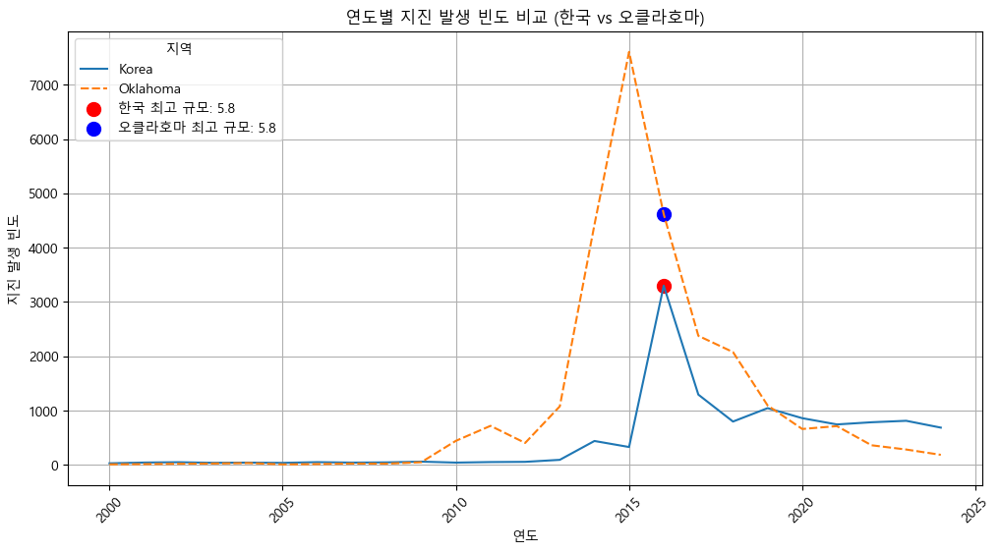

In [ ]:
# 2000년 이후의 데이터만 필터링
df_okc_filtered = df_okc[df_okc['연도'] >= 2000]

# 연도별 지진 발생 빈도 집계
kor_cnt = df_kor['연도'].value_counts().sort_index()
okc_cnt = df_okc_filtered['연도'].value_counts().sort_index()

# 데이터프레임으로 변환
counts_df = pd.DataFrame({
    'Korea': kor_cnt,
    'Oklahoma': okc_cnt
}).fillna(0)  # 결측값 0으로 채우기

# 최고 규모 찾기
max_kor = df_kor['규모'].max()
max_okc = df_okc_filtered['규모'].max()

# 최고 규모의 연도 찾기
max_kor_year = df_kor.loc[df_kor['규모'] == max_kor, '연도'].values[0]
max_okc_year = df_okc_filtered.loc[df_okc_filtered['규모'] == max_okc, '연도'].values[0]

# 그래프 그리기
plt.figure(figsize=(12, 6))
sns.lineplot(data=counts_df)
plt.title('연도별 지진 발생 빈도 비교 (한국 vs 오클라호마)')
plt.xlabel('연도')
plt.ylabel('지진 발생 빈도')
plt.xticks(rotation=45)
plt.legend(title='지역', labels=['한국', '오클라호마'])
plt.grid()

# 최고 규모 마커 추가
plt.scatter(max_kor_year, kor_cnt[max_kor_year], color='red', s=100, label=f'한국 최고 규모: {max_kor}')
plt.scatter(max_okc_year, okc_cnt[max_okc_year], color='blue', s=100, label=f'오클라호마 최고 규모: {max_okc}')

plt.legend(title='지역', loc='upper left')
plt.show()

지진빈도가 증가한 시점에서 큰 지진이 발생

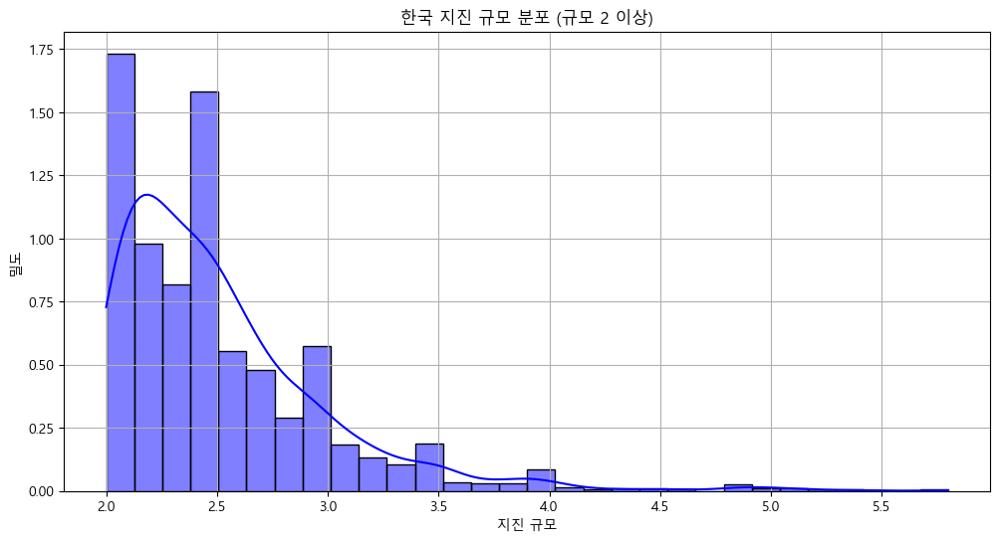

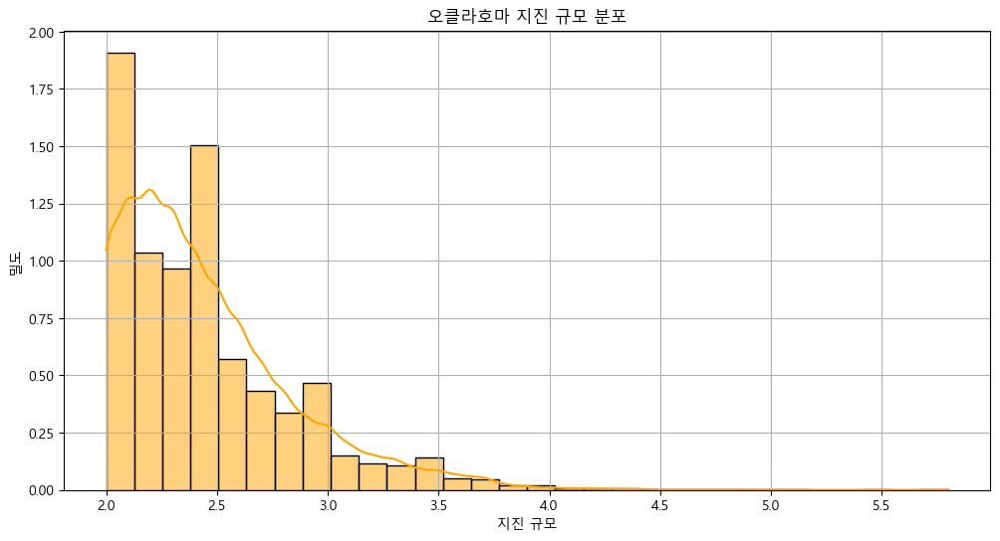

In [ ]:
# 규모 2 이상 필터링
df_kor_okc_filtered = df_kor[df_kor['규모'] >= 2]

# 한국 지진 규모 분포 히스토그램 (규모 2 이상)
plt.figure(figsize=(12, 6))
sns.histplot(df_kor_okc_filtered['규모'], bins=30, color='blue', kde=True, stat='density', alpha=0.5)
plt.title('한국 지진 규모 분포 (규모 2 이상)')
plt.xlabel('지진 규모')
plt.ylabel('밀도')
plt.grid()
plt.show()

# 오클라호마 지진 규모 분포 히스토그램
plt.figure(figsize=(12, 6))
sns.histplot(df_okc['규모'], bins=30, color='orange', kde=True, stat='density', alpha=0.5)
plt.title('오클라호마 지진 규모 분포')
plt.xlabel('지진 규모')
plt.ylabel('밀도')
plt.grid()
plt.show()

규모가 2이상인 데이터에서 규모의 분포가 비슷하게 나타남
한국과 오클라호마는 불의고리, 지진대에도 속하지 않지만 비슷한 경향을 나타냄 -> 다른 외부요인이 있었을 것임

- 오클라호마 지진과 포항 지진의 공통점

오클라호마 지진과 포항 지진의 주요 공통점은 다음과 같습니다:

1. 인공적 요인에 의한 유발지진:

두 지진 모두 인간의 활동으로 인해 발생한 유발지진으로 추정됩니다[1][2]. 오클라호마의 경우 석유 산업의 폐수 주입이, 포항의 경우 지열발전을 위한 물 주입이 원인으로 지목되었습니다.

2. 유체 주입과의 연관성:

두 지역 모두 지하에 유체(폐수 또는 물)를 주입하는 과정이 지진 발생과 밀접한 관련이 있는 것으로 나타났습니다[1][4]. 유체 주입이 지반의 압력과 응력 변화를 일으켜 지진을 촉발했다는 분석이 있습니다.

3. 지진 발생 빈도 증가:

두 지역 모두 유체 주입 활동 이후 지진 발생 빈도가 급격히 증가했습니다[1][4]. 오클라호마의 경우 규모 3급 지진이 연간 1-2회에서 일일 1-2회로 증가했고, 포항의 경우 이전에 거의 없던 지진이 빈번하게 발생하기 시작했습니다.

4. 과학적 논란과 연구:

두 지진 모두 초기에는 원인에 대한 논란이 있었으나, 이후 과학적 연구를 통해 인공적 요인이 주요 원인일 가능성이 높다는 결론에 도달했습니다[1][4][5].

5. 정책적 대응:

두 사례 모두 지진 발생 후 관련 활동(폐수 주입 또는 지열발전)에 대한 규제나 중단 조치가 이루어졌습니다[1][5].

이러한 공통점들은 인간의 지하 활동이 지진 발생에 미치는 영향에 대한 중요한 사례로, 향후 유사한 프로젝트를 계획할 때 신중한 접근이 필요함을 시사합니다.